# Additonal figures for paper

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import matplotlib as mpl

import rasterio
from rasterio.windows import Window
import geopandas as gpd
import cartopy.crs as ccrs
import cartopy.feature as cfeature

import PIL
import cv2

import glob
import os

import utils
import importlib
importlib.reload(utils)
import evaluation as eval

data_path = "/Users/conorosullivan/Documents/git/COASTAL_MONITORING/sentinel2-irish-coastal-segmentation/data"
figure_path = "/Users/conorosullivan/Google Drive/My Drive/1 UCD/0 research/JP02 - Vegetation Line/Figures"

#colours
blue = "#648fff" #2017
orange = "#fe6100" #2019
red = "#dc267f" #2021
rgb_red = [220, 38, 127]
purple = "#785EF0" #overall
yellow = "#FFB000"

In [2]:
def crop_white_boarder(img,bounds=False):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Threshold the image to create a binary mask of non-white areas
    _, thresh = cv2.threshold(gray, 240, 255, cv2.THRESH_BINARY_INV)

    # Find contours of the non-white areas
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if contours:
        # Get the bounding box of the largest contour
        x, y, w, h = cv2.boundingRect(max(contours, key=cv2.contourArea))

        # Crop the image using the bounding box
        cropped_img = img[y:y+h, x:x+w]
        if bounds:
            return cropped_img, (x, y, w, h)
        else:
            return cropped_img
    else:
        # If no contours found, return the original image
        return img

def combine_binary_map_and_band(band,binary_map,alpha=0.6,colour=[255,0,0]):

    """ Create coloured image from binary map"""

    if band.shape[-1] != 3:

        band = (band - band.min()) / (band.max() - band.min())
        band = band*255
        band = band.astype(np.uint8)
        band_stacked = np.stack([band, band, band], axis=-1)  # shape (H, W, 3)
    else:
        band_stacked = band

    # --- 2. Blend red where GB == 1 ---
    red_overlay = np.array(colour)  # red color

    # Only apply where GB == 1
    mask = binary_map == 1
    band_stacked[mask] = (1-alpha) * band_stacked[mask] + alpha * red_overlay

    return band_stacked

# --- Load processed files ---
processed_file_path = os.path.join(data_path, "processed", "meta", "processed_files.csv")
processed_files = pd.read_csv(processed_file_path)
processed_files = processed_files[processed_files["vegetation_line"] == True]
processed_files.head(5)

,ID,filename,aoi,left,top,right,bottom,date,year,vegetation_line
0,20241222T113409_tramore,S2B_MSIL2A_20241222T113409_N0511_R080_T29UPT_2...,tramore,624005.0,5783015.0,633005.0,5777015.0,2024-12-22,2024,True
1,20241127T113421_tramore,S2A_MSIL2A_20241127T113421_N0511_R080_T29UPT_2...,tramore,624005.0,5783015.0,633005.0,5777015.0,2024-11-27,2024,True
2,20241120T114401_tramore,S2A_MSIL2A_20241120T114401_N0511_R123_T29UPT_2...,tramore,624005.0,5783015.0,633005.0,5777015.0,2024-11-20,2024,True
3,20241021T114351_tramore,S2A_MSIL2A_20241021T114351_N0511_R123_T29UPT_2...,tramore,624005.0,5783015.0,633005.0,5777015.0,2024-10-21,2024,True
4,20241011T114351_tramore,S2A_MSIL2A_20241011T114351_N0511_R123_T29UPT_2...,tramore,624005.0,5783015.0,633005.0,5777015.0,2024-10-11,2024,True


### Figure: introduction

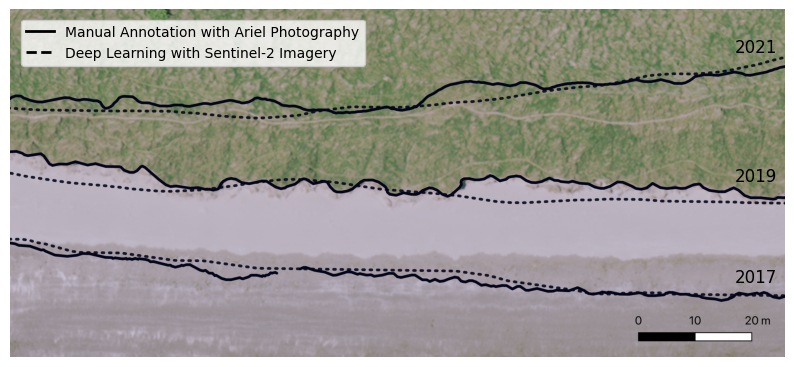

In [8]:
fig, ax = plt.subplots(1,1, figsize=(10,6))

crop_path = "/Users/conorosullivan/Library/CloudStorage/GoogleDrive-conorosully1@gmail.com/My Drive/1 UCD/0 research/Thesis/intro_vegetation_lines.png"
img1 = PIL.Image.open(crop_path)
img1 = crop_white_boarder(np.array(img1))

ax.imshow(img1)


# create custom legend
handles = [

    plt.Line2D([0], [0], color='black', lw=2, label='Manual Annotation with Ariel Photography'),
    plt.Line2D([0], [0], color='black', lw=2,linestyle='--', label='Deep Learning with Sentinel-2 Imagery')


]
ax.legend(handles=handles, loc='upper left', fontsize=10, bbox_to_anchor=(0.005, 0.99))

# Add three dates as text on the right side
ax.text(0.99, 0.89, '2021', color='black', fontsize=12, ha='right', va='center', transform=ax.transAxes)
ax.text(0.99, 0.52, '2019', color='black', fontsize=12, ha='right', va='center', transform=ax.transAxes)
ax.text(0.99, 0.23, '2017', color='black', fontsize=12, ha='right', va='center', transform=ax.transAxes)


ax.set_xticks([])
ax.set_yticks([])
ax.axis('off')

save_path = os.path.join(figure_path, "intro_vegetation_lines.png")
plt.savefig(save_path, bbox_inches='tight', dpi=300, format='png')

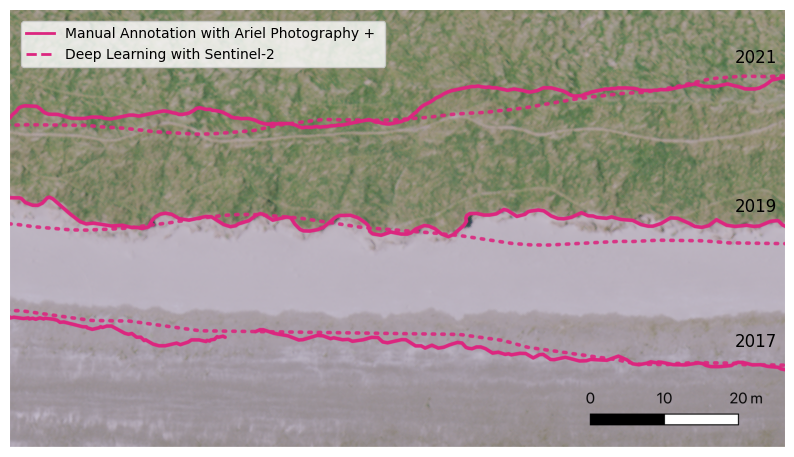

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(10,6))

crop_path = figure_path+ "/rough/fig1.tif"
img1 = PIL.Image.open(crop_path)
img1 = crop_white_boarder(np.array(img1))

ax.imshow(img1)


# create custom legend
handles = [

    plt.Line2D([0], [0], color=red, lw=2, label='Manual Annotation with Ariel Photography'),
    plt.Line2D([0], [0], color=red, lw=2,linestyle='--', label='Deep Learning with Sentinel-2')


]
ax.legend(handles=handles, loc='upper left', fontsize=10, bbox_to_anchor=(0.005, 0.99))

# Add three dates as text on the right side
ax.text(0.99, 0.89, '2021', color='black', fontsize=12, ha='right', va='center', transform=ax.transAxes)
ax.text(0.99, 0.55, '2019', color='black', fontsize=12, ha='right', va='center', transform=ax.transAxes)
ax.text(0.99, 0.24, '2017', color='black', fontsize=12, ha='right', va='center', transform=ax.transAxes)


ax.set_xticks([])
ax.set_yticks([])
ax.axis('off')

save_path = os.path.join(figure_path, "fig1.svg")
plt.savefig(save_path, bbox_inches='tight', dpi=400, format='svg')

### Figure: areas of interest

Saving map to: /Users/conorosullivan/Google Drive/My Drive/1 UCD/0 research/JP02 - Vegetation Line/Figures/rough/fig2_ireland_map.png


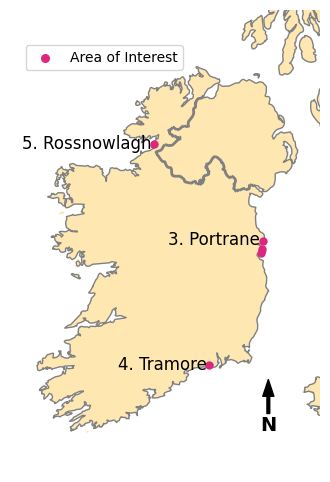

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import os

# --- 1. Define points (lat, lon) ---
points = [
    (53.371763767947414, -6.149601440226983),   # 1. Bull Island
    (53.41645277618201, -6.119027060989851),      # 2. Portmarnock
    (53.5014079187087, -6.110292945653212),      # 3. Portrane
    (52.15837947595477, -7.143904183132022),      # 4. Tramore
    (54.55023228884905, -8.210715488469747),    # 5. Rossnowlagh
]

# Corresponding labels (None for points without label)
labels = [None, None, "3. Portrane", "4. Tramore", "5. Rossnowlagh"]
# --- 2. Create figure ---
fig = plt.figure(figsize=(4,6))
ax = plt.axes(projection=ccrs.PlateCarree())

# --- 3. Add Ireland outline ---
ax.add_feature(cfeature.BORDERS, edgecolor='grey', linewidth=2)
ax.add_feature(cfeature.LAND, facecolor=yellow, alpha=0.3)
ax.add_feature(cfeature.COASTLINE, edgecolor='grey', linewidth=1)

# --- 4. Plot points ---
for (lat, lon), label in zip(points, labels):
    ax.plot(lon, lat, 'o', markersize=5, color=red)
    if label:
        ax.text(lon-0.05, lat-0.05, label, fontsize=12, color='black', ha='right')

# --- 5. Crop map around Ireland ---
ax.set_extent([-11, -5, 51, 56], crs=ccrs.PlateCarree())
ax.set_aspect('auto')
ax.axis('off')

# --- 6. Add north arrow ---
# Coordinates for arrow (in map coordinates)
x_arrow, y_arrow = -6, 52
ax.annotate('N',
            xy=(x_arrow, y_arrow),
            xytext=(x_arrow, y_arrow-0.5),
            arrowprops=dict(facecolor='black', width=2, headwidth=8),
            ha='center', va='center', fontsize=14, fontweight='bold')

# --- 7. Add legend ---
study_point = ax.scatter([], [], color=red, s=30, label='Area of Interest')
ax.legend(handles=[study_point], loc=(0.05, 0.87), fontsize=10, frameon=True, framealpha=0.8)

# --- 8. Save image ---
map_path = os.path.join(figure_path, "rough/fig2_ireland_map.png")
print(f"Saving map to: {map_path}")
plt.savefig(map_path, bbox_inches='tight', dpi=600, format='png')
plt.show()

In [71]:
import cv2
import numpy as np

def add_scale_bar(img, scale_m=1000, pixel_size=10, bar_height=10, margin=10, color=(255,255,255), text_color=(255,255,255)):
    """
    Add a scale bar with text in the top-right corner of an RGB image.

    Parameters:
    - img: numpy array of shape (H, W, 3), values 0-255
    - scale_m: length of the scale bar in meters
    - pixel_size: resolution of the image in meters per pixel
    - bar_height: thickness of the scale bar in pixels
    - margin: distance from top-right corner in pixels
    - color: RGB tuple for the bar color
    - text_color: RGB tuple for the text color

    Returns:
    - img_copy: modified image with scale bar
    """
    img_copy = img.copy()
    scale_px = scale_m // pixel_size

    # Draw the bar at top-right
    y_start = margin
    x_start = img_copy.shape[1] - margin - scale_px
    img_copy[y_start:y_start+bar_height, x_start:x_start+scale_px] = color

    # Add text above the bar
    text = f"{scale_m} m"
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 0.8
    thickness = 2
    text_size = cv2.getTextSize(text, font, font_scale, thickness)[0]
    text_x = x_start + scale_px//2 - text_size[0]//2
    text_y = y_start + bar_height + text_size[1] + 5  # just below the bar
    cv2.putText(img_copy, text, (text_x, text_y), font, font_scale, text_color, thickness, cv2.LINE_AA)

    return img_copy

In [53]:
# Get example Sentinel-2 scene
file_name = "S2A_MSIL2A_20240623T114351_N0510_R123_T29UPV_20240623T164349"
safe_folder = f"location_examples/{file_name}.SAFE"
safe_directory = os.path.join("../data/raw/", safe_folder)

stacked_bands, meta_data  = utils.stack_10m_bands(safe_directory)

rgb = utils.get_rgb(stacked_bands,r=2,contrast=0.4)
rgb = utils.enhance_rgb(rgb, factor=1.5)

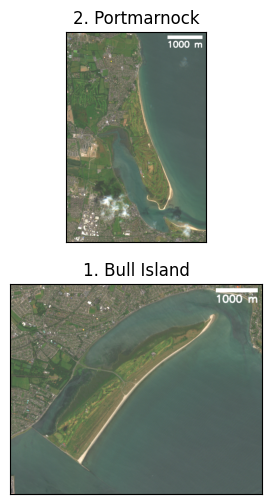

In [72]:
fig,ax = plt.subplots(2,1, figsize=(4,6))

# Portmarnock
x1,y1,x2,y2 = 8900,7450,9300,8050
crop_rgb = rgb[y1:y2,x1:x2]
crop_rgb = add_scale_bar(crop_rgb)
ax[0].imshow(crop_rgb)
ax[0].set_title("2. Portmarnock")

# Bull Island
x1,y1,x2,y2 = 8700,8050,9300,8550
crop_rgb = rgb[y1:y2,x1:x2]
crop_rgb = add_scale_bar(crop_rgb)
ax[1].imshow(crop_rgb)
ax[1].set_title("1. Bull Island")


for a in ax:
    a.set_xticks([])
    a.set_yticks([])

example_path = os.path.join(figure_path, "rough/fig2_location_examples.eps")
plt.savefig(example_path, bbox_inches='tight', dpi=600, format='eps')

### Table: number of scenes per year and area of interest 

In [26]:
# count by aoi and year
count = processed_files.groupby(["aoi", "year"]).size().reset_index(name='count').sort_values(by=["aoi", "year"])

# pivot so year is columns
pivot_count = count.pivot(index="aoi", columns="year", values="count").fillna(0).astype(int)
print(len(processed_files))
pivot_count

114


year,2017,2019,2020,2022,2023,2024
aoi,,,,,,
bull_island,8,11,0,0,8,0
portmarnock,8,10,0,0,0,0
portrane,0,11,8,9,0,10
rossnowlagh,0,0,0,16,0,0
tramore,0,0,0,0,0,15


### Figure: spectral band, guidance band and target

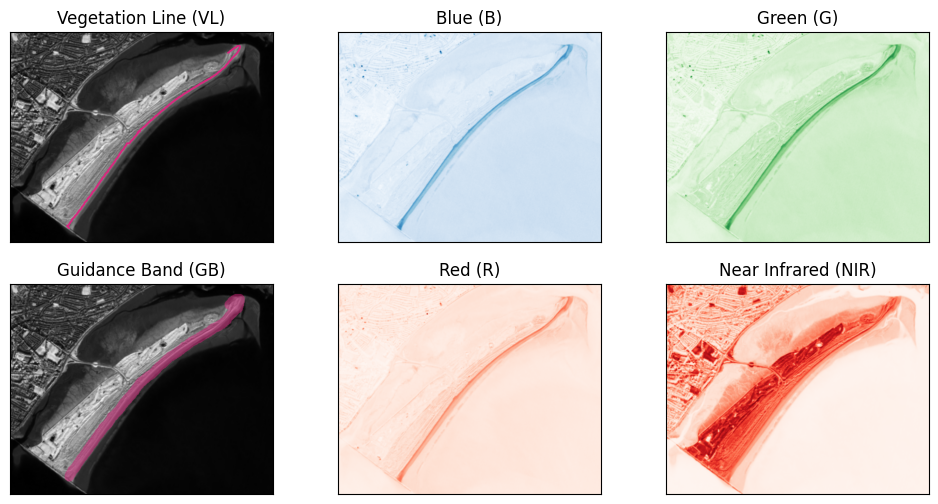

In [6]:
example_path = os.path.join(data_path, "SIVE/test_1/20171129T113419_bull_island.npy")
example = np.load(example_path)
c = 250
example = example[:,c:-c, c:-c]

fig, ax = plt.subplots(2,3, figsize=(12,6))

# Get all individual bands
B = example[2]
G = example[1]
R = example[0]
NIR = example[3]
GB = example[4]
VL = example[5]

RGB = np.dstack((R,G,B))
RGB = utils.get_rgb(RGB,contrast=0.4)
#Enhance 

band = NIR.copy()

VL = cv2.dilate(VL.astype(np.uint8), np.ones((3,3), np.uint8), iterations=1)
VL = combine_binary_map_and_band(band,VL,alpha=1,colour=rgb_red)

ax[0,0].imshow(VL)
ax[0,0].set_title('Vegetation Line (VL)')

band = NIR.copy()
GB = combine_binary_map_and_band(band,GB,alpha=0.5,colour=rgb_red)

ax[1,0].imshow(GB)
ax[1,0].set_title('Guidance Band (GB)')

ax[0,1].imshow(B, cmap='Blues')
ax[0,1].set_title('Blue (B)')
ax[0,2].imshow(G, cmap='Greens')
ax[0,2].set_title('Green (G)')
ax[1,1].imshow(R, cmap='Reds')
ax[1,1].set_title('Red (R)')
ax[1,2].imshow(NIR, cmap='Reds')
ax[1,2].set_title('Near Infrared (NIR)')


for a in ax.flatten():
    a.set_xticks([])
    a.set_yticks([])

save_path = os.path.join(figure_path, "fig3.tif")
plt.savefig(save_path, bbox_inches='tight', dpi=400, format='tif')

## Figure : geolocation correction

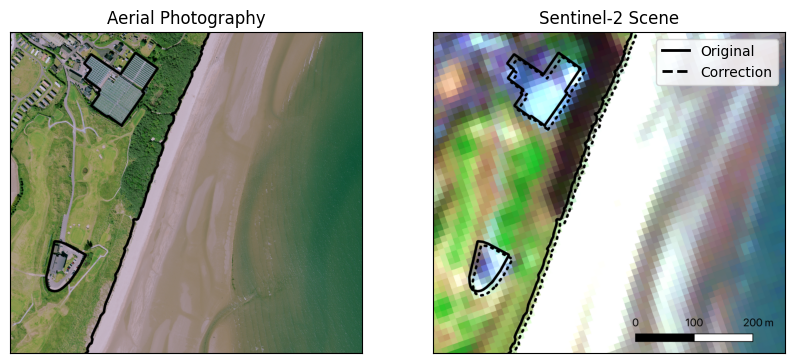

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(10,6))

crop_path = figure_path+ "/rough/fig4_crop{}.tif"
img1 = PIL.Image.open(crop_path.format(1))
img1, (x, y, w, h) = crop_white_boarder(np.array(img1),bounds=True)

ax[0].imshow(img1)
ax[0].set_title('Aerial Photography')

img2 = PIL.Image.open(crop_path.format(2))
img2 = np.array(img2)[y:y+h, x:x+w]
ax[1].imshow(img2)
ax[1].set_title('Sentinel-2 Scene')

for a in ax.flatten():
    a.set_xticks([])
    a.set_yticks([])

# create custom legend
handles = [
    plt.Line2D([0], [0], color='black', lw=2, label='Original'),
    plt.Line2D([0], [0], color='black', lw=2, linestyle='--', label='Correction')
]
ax[1].legend(handles=handles, loc='upper right', fontsize=10)

save_path = os.path.join(figure_path, "fig4.tif")
plt.savefig(save_path, bbox_inches='tight', dpi=400, format='tif')


## Figure: cropping 

In [35]:
veg_lines_path = os.path.join(data_path, "processed/vegetation_lines/vegetation_lines_annotations.shp")
veg_lines = gpd.read_file(veg_lines_path)
veg_lines.head()

def get_points(line,m=100):
    """
    Convert a shapely geometry to a list of points
    """
   
    length = line.geometry.length

    # Get points every m meters along the line
    num_points = int(length / m)
    points = [line.geometry.interpolate(distance, normalized=False) 
            for distance in np.linspace(0, length, num_points)]
    
    # Include last point if not already included
    if points[-1] != line.geometry.coords[-1]:
        points.append(line.geometry.interpolate(length, normalized=False))
    
    # make sure start point is included
    first_point = line.geometry.coords[0]
    assert first_point == tuple(points[0].coords[0]), "First point does not match"

    # make sure end point is included
    last_point = line.geometry.coords[-1]
    assert last_point == tuple(points[-1].coords[0]), "Last point does not match"
    
    return points

ID = "20171227T114501_bull_island"
example_raster_path = os.path.join(data_path, f"processed/aoi_stacked/bull_island/2017/{ID}.tif")

example_raster = rasterio.open(example_raster_path)
print(ID)

#crop raster 
veg_line = veg_lines[veg_lines['ID'] == ID].sample(n=1).iloc[0]
print(veg_line.geometry.length)

points = get_points(veg_line,m=100)
print(len(points))
print(points[0])

20171227T114501_bull_island
5406.936779018211
55
POINT (688629.4180177618 5915255.479428639)


(144, 144, 3)


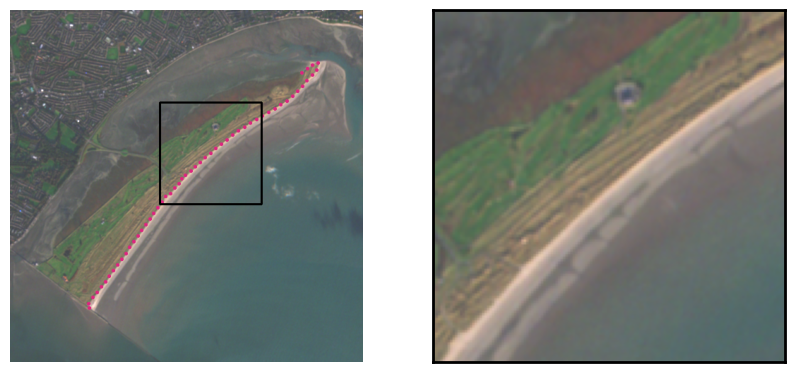

In [37]:
# Create RGB image from raster
rgb = example_raster.read()
rgb = utils.get_rgb(rgb,r=0,b=2 ,contrast=0.4)
rgb = utils.enhance_rgb(rgb, factor=1.5)
point_rgb = rgb.copy()

# Add blue points to rgb image
for point in points:
    utmx, utmy = point.x, point.y
    y, x = example_raster.index(utmx, utmy)
    point_rgb  = cv2.circle(point_rgb , (x, y), 1, rgb_red,2)


# add a square of 144 by 144 pixels center on one of the points
square_size = 144
point = points[30]
utmx, utmy = point.x, point.y
y, x = example_raster.index(utmx, utmy)

# draw square on point_rgb
point_rgb = cv2.rectangle(point_rgb, (x - square_size // 2, y - square_size // 2), (x + square_size // 2, y + square_size // 2), (0, 0, 0), 2)

# remove buffer
crop = 200
point_rgb = point_rgb[crop:-crop, crop+50:-crop-50]

# Plo
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(point_rgb)

# Crop the same area from the original image
rgb_crop = rgb[y - square_size // 2:y + square_size // 2, x - square_size // 2:x + square_size // 2]
ax[1].imshow(rgb_crop)
print(rgb_crop.shape)

ax[0].axis('off')
ax[1].set_xticks([])
ax[1].set_yticks([])
#make axis thicker
ax[1].spines['top'].set_linewidth(2)
ax[1].spines['right'].set_linewidth(2)
ax[1].spines['left'].set_linewidth(2)
ax[1].spines['bottom'].set_linewidth(2)

save_path = os.path.join(figure_path, "rough/fig5.tif")
plt.savefig(save_path, bbox_inches='tight', dpi=600, format='tif')

## Figure: augmentations

In [38]:
def random_crop(raster, point, seed=0,crop_size=144, augmentation=True):

    utmx = point.x
    utmy = point.y

    y, x = raster.index(utmx, utmy)

    #set seed
    np.random.seed(seed)


# Get cropped window centered around the point
    window_x = x - crop_size // 2 
    window_y = y - crop_size // 2

    # Offset the window by a random amount within the crop size
    if augmentation:
        window_x += np.random.randint(-crop_size // 2, crop_size // 2)
        window_y += np.random.randint(-crop_size // 2, crop_size // 2)

    # Define the window for cropping
    window = Window(window_x, window_y, crop_size, crop_size)
    
    # Read 6-band image crop
    instance = raster.read(window=window)

    if augmentation:
        # Randomly flip the image and mask crops
        if np.random.rand() > 0.5:
            instance = np.flip(instance, axis=1) #axis 0 is bands, axis 1 is y, axis 2 is x

        if np.random.rand() > 0.5:
            instance = np.flip(instance, axis=2)
    
        # Randomly rotate the image and mask crops
        angle = np.random.choice([0, 90, 180, 270])
        instance = np.rot90(instance, k=angle//90, axes=(1, 2))

        guidance = instance[-2]

        # random errosion and dilation
        k= np.random.choice([3,5])
        i = np.random.randint(1, 3)
        kernel = np.ones((k, k), np.uint8)
        
        if np.random.rand() > 0.5:
            guidance = cv2.erode(guidance.astype(np.uint8), kernel, iterations=i)
        if np.random.rand() > 0.5:
            guidance = cv2.dilate(guidance.astype(np.uint8), kernel, iterations=i)
        instance[-2] = guidance    

    return instance


55
POINT (688629.4180177618 5915255.479428639)


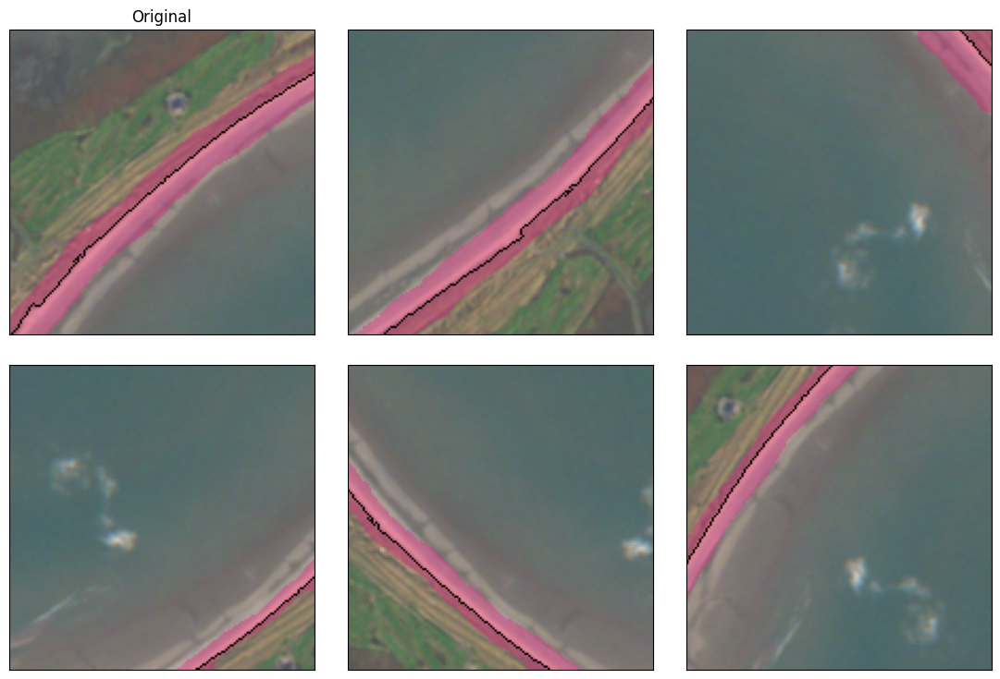

In [40]:
ID = "20171227T114501_bull_island"
example_raster_path = os.path.join(data_path, f"processed/aoi_stacked/bull_island/2017/{ID}.tif")

example_raster = rasterio.open(example_raster_path)

veg_line = veg_lines[veg_lines['ID'] == ID].sample(n=1).iloc[0]

points = get_points(veg_line,m=100)
print(len(points))
print(points[0])

point = points[30]

def get_overlay(instance):
    overlay = instance.copy()
    overlay = utils.get_rgb(overlay,r=0,b=2 ,contrast=0.4)
    overlay = utils.enhance_rgb(overlay, factor=1.5)

    overlay = combine_binary_map_and_band(overlay, instance[-2],alpha=0.4,colour=rgb_red)
    overlay = combine_binary_map_and_band(overlay, instance[-1],alpha=1,colour=[0,0,0])

    return overlay

fig, ax = plt.subplots(2, 3, figsize=(15, 9))

original = random_crop(example_raster, point, crop_size=144, augmentation=False)
original = get_overlay(original)

ax_flat = ax.ravel()

ax_flat[0].imshow(original)
ax_flat[0].set_title('Original')
ax_flat[0].set_xticks([])
ax_flat[0].set_yticks([])

seeds = [1,15,6,19,24]

for i in range(1, 6):
    example_raster = rasterio.open(example_raster_path)
    augment = random_crop(example_raster, point, seed=seeds[i-1], crop_size=144, augmentation=True)
    augment = get_overlay(augment)
    ax_flat[i].imshow(augment)
    ax_flat[i].set_xticks([])
    ax_flat[i].set_yticks([])


#reduce space between subplots
plt.subplots_adjust(wspace=-0.15, hspace=0.1)

save_path = os.path.join(figure_path, "fig6.tif")
fig.savefig(save_path, bbox_inches='tight', dpi=300, format='tif')

## Figure: edge map combination

In [41]:
# Load the model
best_model_name= "SIVE_04JUN2025_HED_BigEarthNet_trainable_guided_wBCE.pth"
model_path = f'../models/SIVE_04JUN2025/{best_model_name}'
model, meta_data = utils.get_model(model_path)

# Points dictionary
points_dict = np.load('../data/SIVE/points_dict.npy', allow_pickle=True).item()
points_dict.keys()

dict_keys(['20240623T114351_tramore', '20221211T114501_rossnowlagh', '20221204T115451_rossnowlagh', '20221116T114349_rossnowlagh', '20221007T114349_rossnowlagh', '20220922T114401_rossnowlagh', '20220910T115359_rossnowlagh', '20220905T115411_rossnowlagh', '20220813T114401_rossnowlagh', '20220811T115409_rossnowlagh', '20220722T115409_rossnowlagh', '20220607T115411_rossnowlagh', '20220604T114401_rossnowlagh', '20220523T115359_rossnowlagh', '20220408T115401_rossnowlagh', '20220326T114351_rossnowlagh', '20220319T115401_rossnowlagh', '20240211T113311_portrane', '20220323T113321_portrane', '20201002T114401_portrane', '20190707T113321_portrane', '20190207T113321_portmarnock', '20171129T113419_portmarnock', '20230904T113321_bull_island', '20230604T114349_bull_island', '20230530T114351_bull_island', '20230420T114351_bull_island', '20190920T113319_bull_island', '20190826T113321_bull_island', '20190707T113321_bull_island', '20190627T113321_bull_island', '20190501T114351_bull_island', '20190411T114

In [42]:
# Test data
target_pos = -1

test_file = '../data/SIVE/test_1/'
test_paths = glob.glob(test_file + '*.npy')
test_targets = [np.load(file)[target_pos] for file in test_paths]
test_input = [np.load(file)[0:target_pos] for file in test_paths]

# Select example 
i = 7
path = test_paths[i]

ID = os.path.basename(path).split('.')[0]
points = points_dict[ID]

image = np.load(path)
crop_paths, start_points = utils.get_iterative_crops(image, points)
target_crops, pred_crops = eval.get_preds(model,meta_data["guidance"], crop_paths, batch_size=1)

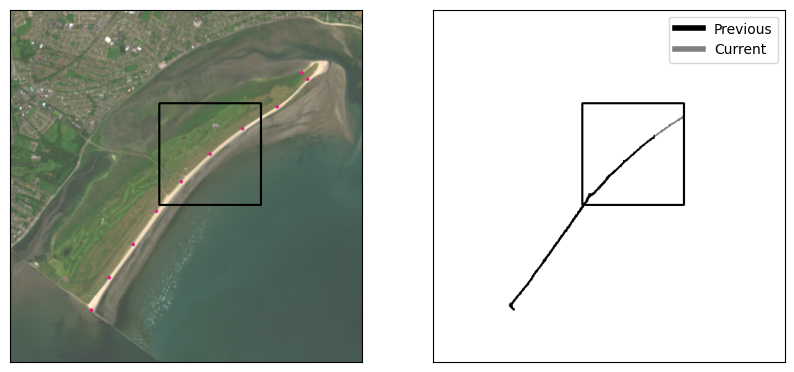

In [44]:
rgb = image.transpose(1, 2, 0)
rgb = utils.get_rgb(rgb,r=0,b=2,contrast=0.4)


rgb = utils.enhance_rgb(rgb, factor=1.5)
point_rgb = rgb.copy()

# Add blue points to rgb image
for point in points[1]:
    x,y = point[0], point[1]
    point_rgb  = cv2.circle(point_rgb , (x, y), 1, rgb_red,2)

# add a square of 144 by 144 pixels center on one of the points
square_size = 144
n = 5 # point index
point = points[1][n]

x,y = point[0], point[1]

point_rgb = cv2.rectangle(point_rgb, (x - square_size // 2, y - square_size // 2), (x + square_size // 2, y + square_size // 2), (0, 0, 0), 2)

# remove buffer
crop = 200
point_rgb = point_rgb[crop:-crop, crop+50:-crop-50]

combined_pred = utils.combine_crops(pred_crops[:n], start_points[:n], image)
combined_pred[y-square_size//2:y+square_size//2, x-square_size//2:x+square_size//2] += pred_crops[n]/2
combined_pred = np.clip(combined_pred, 0, 1)

combined_pred = cv2.rectangle(combined_pred, (x - square_size // 2, y - square_size // 2), (x + square_size // 2, y + square_size // 2), (1, 1, 1), 2)
combined_pred = combined_pred[crop:-crop, crop+50:-crop-50]

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

ax[0].imshow(point_rgb)
ax[1].imshow(1-combined_pred, cmap='gray')

for a in ax:
    a.set_xticks([])
    a.set_yticks([])

# custom legend with black and grey labels outside the plot on the right
handles = [plt.Line2D([0], [0], color='black', lw=4),
           plt.Line2D([0], [0], color='gray', lw=4)]
ax[1].legend(handles, ['Previous', 'Current'], loc='upper right', bbox_to_anchor=(1, 1), fontsize=10)

save_path = os.path.join(figure_path, "fig8.tif")

plt.savefig(save_path, bbox_inches='tight', dpi=600, format='tif')

## Figure: interpolation

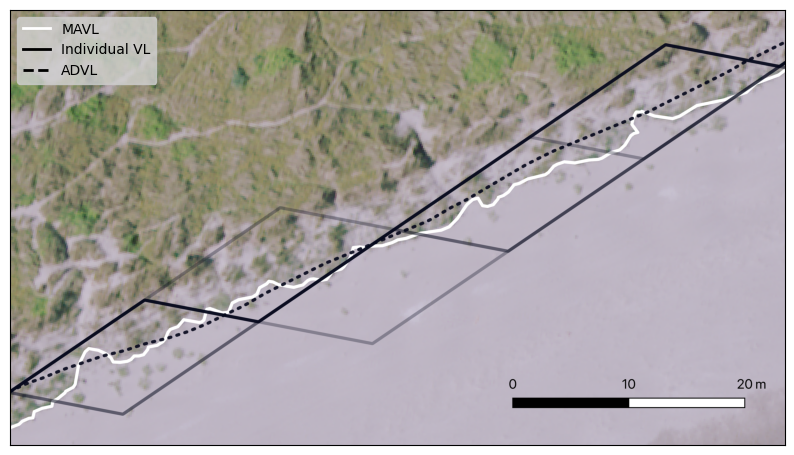

In [45]:
fig, ax = plt.subplots(1,1, figsize=(10,6))


crop_path = figure_path+ "/rough/fig10.tif"
# load pdf
img = PIL.Image.open(crop_path)

img = crop_white_boarder(np.array(img))

ax.imshow(img)


# create custom legend
handles = [
    plt.Line2D([0], [0], color='white', lw=2, label='MAVL'),
    plt.Line2D([0], [0], color='black', lw=2, label='Individual VL'),
    plt.Line2D([0], [0], color='black', lw=2, linestyle='--', label='ADVL')

]
# add grey legend
ax.legend(handles=handles, loc='upper left', fontsize=10, facecolor='lightgrey')

ax.set_xticks([])
ax.set_yticks([])

save_path = os.path.join(figure_path, "fig10.tif")
plt.savefig(save_path, bbox_inches='tight', dpi=400, format='tif')

### Figure: individual lines (thesis)

In [3]:
for fig in ['individual_1.tif','individual_2.tif','individual_overview.tif']:
    fig_path = os.path.join(figure_path, "thesis/" + fig)
    img = PIL.Image.open(fig_path)

    img = crop_white_boarder(np.array(img))

    img = PIL.Image.fromarray(img)

    img.save(fig_path, "TIFF", resolution=100.0)

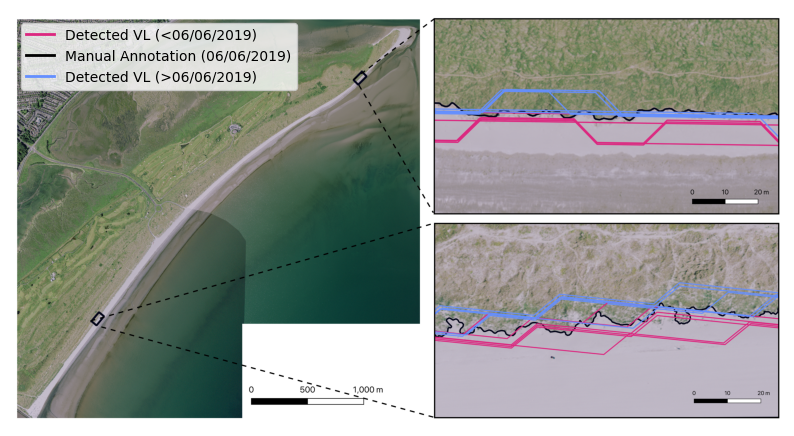

In [6]:
fig, ax = plt.subplots(1,1, figsize=(10,6))

crop_path = figure_path+ "/thesis/individual_lines.tif"
img1 = PIL.Image.open(crop_path)
ax.imshow(img1)


# create custom legend
handles = [
    plt.Line2D([0], [0], color=red, lw=2, label='Detected VL (<06/06/2019)'),
    plt.Line2D([0], [0], color='black', lw=2, label='Manual Annotation (06/06/2019)'),
    plt.Line2D([0], [0], color=blue, lw=2, label='Detected VL (>06/06/2019)'),

]
# shift legend down a bit
ax.legend(handles=handles, loc='upper left', fontsize=10, bbox_to_anchor=(0.005, 0.985))

ax.set_xticks([])
ax.set_yticks([])
ax.axis('off')

save_path = os.path.join(figure_path, "individual_lines.tif")
plt.savefig(save_path, bbox_inches='tight', dpi=300, format='tif')
plt.savefig(save_path.replace('.tif', '.png'), bbox_inches='tight', dpi=300, format='png')

### Figure: manual anotation (thesis)

In [3]:
for fig in ['vl_manual_annotation_crop1.tif','vl_manual_annotation_crop2.tif']:
    fig_path = os.path.join(figure_path, "thesis/" + fig)
    img = PIL.Image.open(fig_path)

    img = crop_white_boarder(np.array(img))

    img = PIL.Image.fromarray(img)

    img.save(fig_path, "TIFF", resolution=100.0)

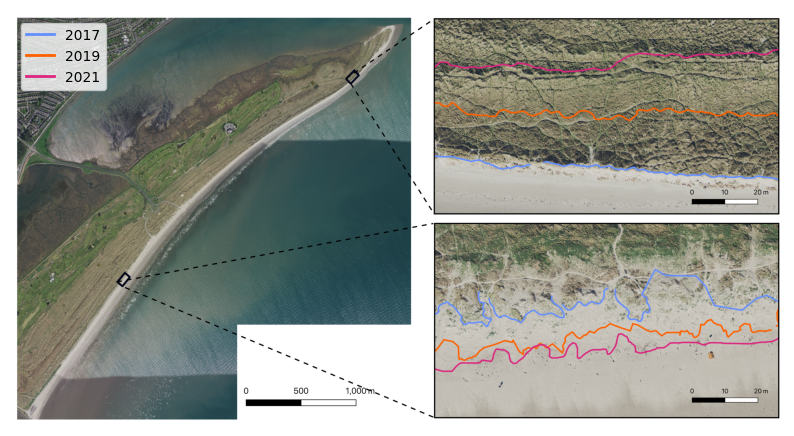

In [7]:
fig, ax = plt.subplots(1,1, figsize=(10,6))

crop_path = figure_path+ "/thesis/vl_manual_annotation.tif"
img1 = PIL.Image.open(crop_path)
ax.imshow(img1)


# create custom legend
handles = [
    plt.Line2D([0], [0], color=blue, lw=2, label='2017'),
    plt.Line2D([0], [0], color=orange, lw=2, label='2019'),
    plt.Line2D([0], [0], color=red, lw=2, label='2021'),

]
# shift legend down a bit
ax.legend(handles=handles, loc='upper left', fontsize=10, bbox_to_anchor=(0.005, 0.985))

ax.set_xticks([])
ax.set_yticks([])
ax.axis('off')

save_path = os.path.join(figure_path, "vl_manual_annotation.tif")
plt.savefig(save_path, bbox_inches='tight', dpi=300, format='tif')
plt.savefig(save_path.replace('.tif', '.png'), bbox_inches='tight', dpi=300, format='png')

### Figure: ADVL Bull Island 

In [56]:
for fig in ['fig15_map.tif','fig15_crop1.tif', 'fig15_crop2.tif', 'fig20_crop1.tif', 'fig20_crop2.tif','fig20_map.tif']:
    fig_path = os.path.join(figure_path, "rough/" + fig)
    img = PIL.Image.open(fig_path)

    img = crop_white_boarder(np.array(img))

    img = PIL.Image.fromarray(img)

    img.save(fig_path, "TIFF", resolution=100.0)

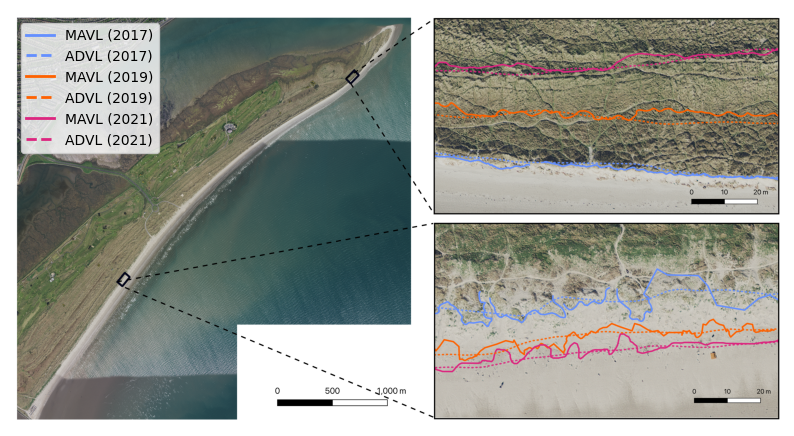

In [57]:
fig, ax = plt.subplots(1,1, figsize=(10,6))

crop_path = figure_path+ "/rough/fig15.tif"
img1 = PIL.Image.open(crop_path)
ax.imshow(img1)


# create custom legend
handles = [
    plt.Line2D([0], [0], color=blue, lw=2, label='MAVL (2017)'),
    plt.Line2D([0], [0], color=blue, lw=2, linestyle='--', label='ADVL (2017)'),
    plt.Line2D([0], [0], color=orange, lw=2, label='MAVL (2019)'),
    plt.Line2D([0], [0], color=orange, lw=2, linestyle='--', label='ADVL (2019)'),
    plt.Line2D([0], [0], color=red, lw=2, label='MAVL (2021)'),
    plt.Line2D([0], [0], color=red, lw=2, linestyle='--', label='ADVL (2021)')

]
# shift legend down a bit
ax.legend(handles=handles, loc='upper left', fontsize=10, bbox_to_anchor=(0.005, 0.985))

ax.set_xticks([])
ax.set_yticks([])
ax.axis('off')

save_path = os.path.join(figure_path, "fig15.tif")
plt.savefig(save_path, bbox_inches='tight', dpi=400, format='tif')

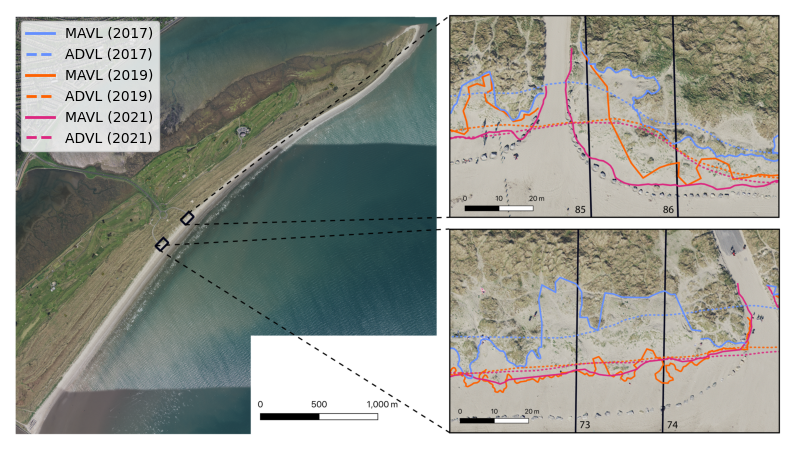

In [60]:
fig, ax = plt.subplots(1,1, figsize=(10,6))

crop_path = figure_path+ "/rough/fig20.tif"
img1 = PIL.Image.open(crop_path)
ax.imshow(img1)


# create custom legend
handles = [
    plt.Line2D([0], [0], color=blue, lw=2, label='MAVL (2017)'),
    plt.Line2D([0], [0], color=blue, lw=2, linestyle='--', label='ADVL (2017)'),
    plt.Line2D([0], [0], color=orange, lw=2, label='MAVL (2019)'),
    plt.Line2D([0], [0], color=orange, lw=2, linestyle='--', label='ADVL (2019)'),
    plt.Line2D([0], [0], color=red, lw=2, label='MAVL (2021)'),
    plt.Line2D([0], [0], color=red, lw=2, linestyle='--', label='ADVL (2021)')

]
ax.legend(handles=handles, loc='upper left', fontsize=10, bbox_to_anchor=(0.005, 0.99))

ax.set_xticks([])
ax.set_yticks([])
ax.axis('off')

save_path = os.path.join(figure_path, "fig20.tif")
plt.savefig(save_path, bbox_inches='tight', dpi=400, format='tif')

### Figure: Erosion Rates Bull Island

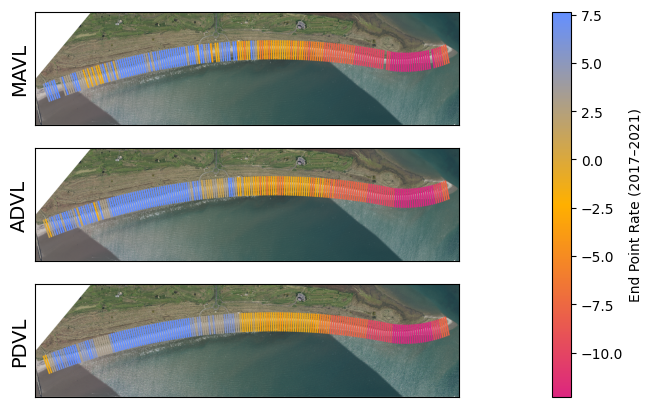

In [5]:
fig, ax = plt.subplots(3,1, figsize=(12,5))

#MAVL
crop_path = figure_path+ "/rough/fig16_mavl.tif"
img1 = PIL.Image.open(crop_path)
img1 = crop_white_boarder(np.array(img1))

ax[0].imshow(img1)
ax[0].set_ylabel("MAVL", fontsize=14)

#ADVL
crop_path = figure_path+ "/rough/fig16_advl.tif"
img2 = PIL.Image.open(crop_path)
img2 = crop_white_boarder(np.array(img2))

ax[1].imshow(img2)
ax[1].set_ylabel("ADVL", fontsize=14)

#PDVL
crop_path = figure_path+ "/rough/fig16_pdvl.tif"
img3 = PIL.Image.open(crop_path)
img3 = crop_white_boarder(np.array(img3))

ax[2].imshow(img3)
ax[2].set_ylabel("PDVL", fontsize=14)

for a in ax:
    a.set_xticks([])
    a.set_yticks([])

# --- Define custom colormap ---
cmap = mpl.colors.LinearSegmentedColormap.from_list(
    "custom", ["#dc267f", "#ffb000", "#648fff"]
)

# --- Create a normalizer (adjust min/max to match your QGIS values) ---
norm = mpl.colors.Normalize(vmin=-12.3, vmax=7.63)  # adjust as needed

# --- Add colorbar ---
cbar = fig.colorbar(
    mpl.cm.ScalarMappable(norm=norm, cmap=cmap),
    ax=ax,
    orientation="vertical",
    fraction=0.05,
    pad=0.1,
)
cbar.set_label("End Point Rate (2017–2021)")

save_path = os.path.join(figure_path, "fig16.tif")
plt.savefig(save_path, bbox_inches='tight', dpi=400, format='tif')

# Figures for probalistic line

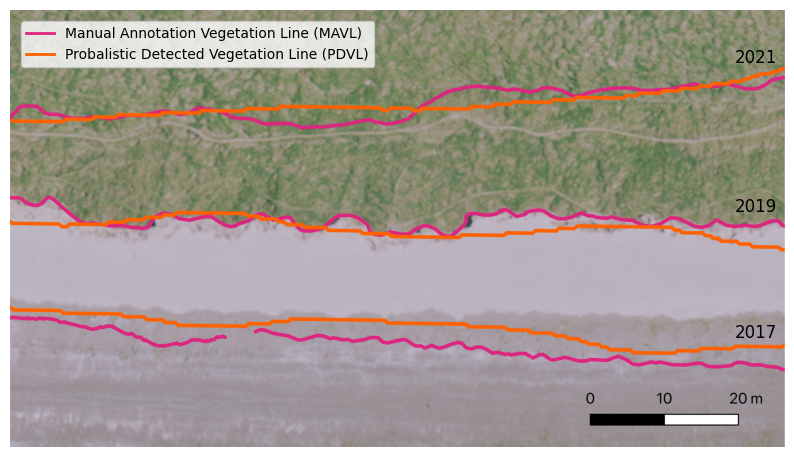

In [16]:
fig, ax = plt.subplots(1,1, figsize=(10,6))

crop_path = figure_path+ "/PDVL Rough/fig1_1.tif"
img1 = PIL.Image.open(crop_path)
img1 = crop_white_boarder(np.array(img1))
ax.imshow(img1)


# create custom legend
handles = [

    plt.Line2D([0], [0], color=red, lw=2, label='Manual Annotation Vegetation Line (MAVL)'),
    plt.Line2D([0], [0], color=orange, lw=2, label='Probalistic Detected Vegetation Line (PDVL)')


]
ax.legend(handles=handles, loc='upper left', fontsize=10, bbox_to_anchor=(0.005, 0.99))

# Add three dates as text on the right side
ax.text(0.99, 0.89, '2021', color='black', fontsize=12, ha='right', va='center', transform=ax.transAxes)
ax.text(0.99, 0.55, '2019', color='black', fontsize=12, ha='right', va='center', transform=ax.transAxes)
ax.text(0.99, 0.26, '2017', color='black', fontsize=12, ha='right', va='center', transform=ax.transAxes)


ax.set_xticks([])
ax.set_yticks([])
ax.axis('off')

save_path = os.path.join(figure_path, "pl_fig1_1.tif")
plt.savefig(save_path, bbox_inches='tight', dpi=400, format='tif')

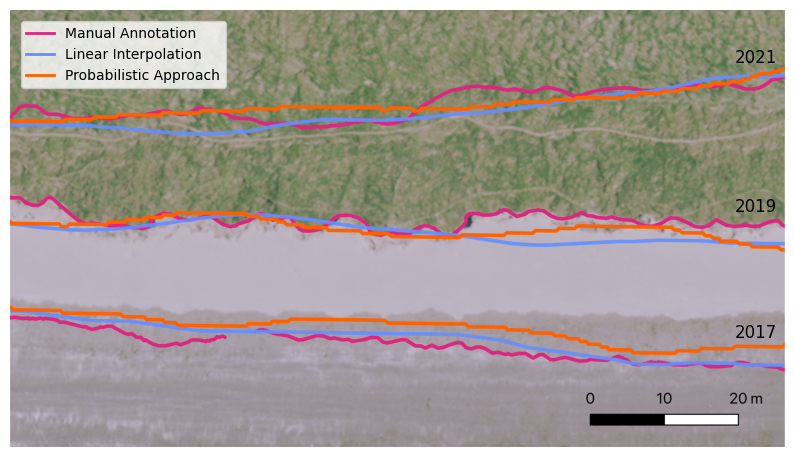

In [17]:
fig, ax = plt.subplots(1,1, figsize=(10,6))

crop_path = figure_path+ "/PDVL Rough/fig1_2.tif"
img1 = PIL.Image.open(crop_path)
img1 = crop_white_boarder(np.array(img1))
ax.imshow(img1)

# create custom legend
handles = [
    plt.Line2D([0], [0], color=red, lw=2, label='Manual Annotation'),
    plt.Line2D([0], [0], color=blue, lw=2, label='Linear Interpolation'),
    plt.Line2D([0], [0], color=orange, lw=2, label='Probabilistic Approach')
]
ax.legend(handles=handles, loc='upper left', fontsize=10, bbox_to_anchor=(0.005, 0.99))

# Add three dates as text on the right side
ax.text(0.99, 0.89, '2021', color='black', fontsize=12, ha='right', va='center', transform=ax.transAxes)
ax.text(0.99, 0.55, '2019', color='black', fontsize=12, ha='right', va='center', transform=ax.transAxes)
ax.text(0.99, 0.26, '2017', color='black', fontsize=12, ha='right', va='center', transform=ax.transAxes)

ax.set_xticks([])
ax.set_yticks([])
ax.axis('off')

save_path = os.path.join(figure_path, "pl_fig1_2.tif")
plt.savefig(save_path, bbox_inches='tight', dpi=400, format='tif')

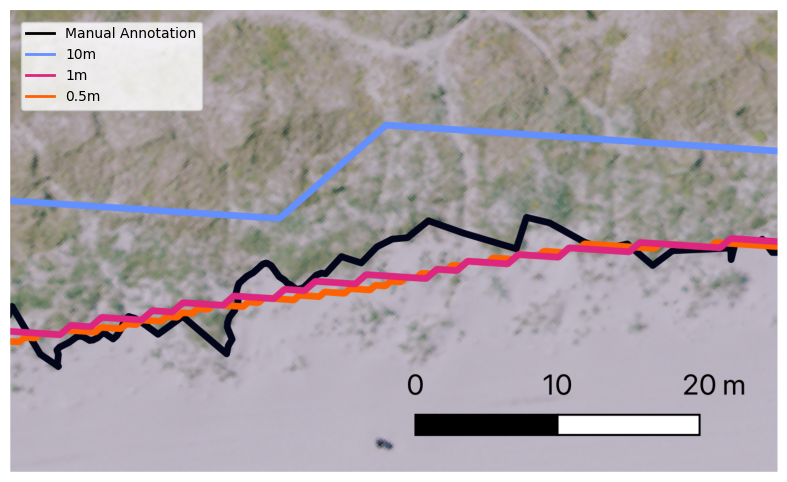

In [18]:
fig, ax = plt.subplots(1,1, figsize=(10,6))

crop_path = figure_path+ "/PDVL Rough/fig4.tif"
img1 = PIL.Image.open(crop_path)
img1 = crop_white_boarder(np.array(img1))
ax.imshow(img1)

# create custom legend
handles = [
    plt.Line2D([0], [0], color='black', lw=2, label='Manual Annotation'),
    plt.Line2D([0], [0], color=blue, lw=2, label='10m'),
    plt.Line2D([0], [0], color=red, lw=2, label='1m'),
    plt.Line2D([0], [0], color=orange, lw=2, label='0.5m')
]
#Add title to legend
ax.legend(handles=handles, loc='upper left', fontsize=10, bbox_to_anchor=(0.005, 0.99))

# Add three dates as text on the right side
ax.set_xticks([])
ax.set_yticks([])
ax.axis('off')

save_path = os.path.join(figure_path, "pl_fig4.tif")
plt.savefig(save_path, bbox_inches='tight', dpi=400, format='tif')

In [7]:
for fig in ['pl_fig5_crop1.tif','pl_fig5_crop2.tif']:
    fig_path = os.path.join(figure_path, "PDVL Rough/" + fig)
    img = PIL.Image.open(fig_path)

    img = crop_white_boarder(np.array(img))

    img = PIL.Image.fromarray(img)

    img.save(fig_path, "TIFF", resolution=100.0)

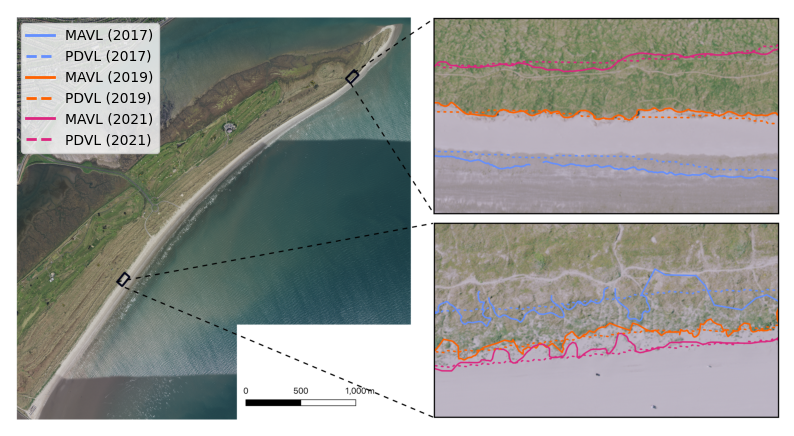

In [14]:
fig, ax = plt.subplots(1,1, figsize=(10,6))

crop_path = figure_path+ "/PDVL Rough/pl_fig5_test.tif"

img1 = PIL.Image.open(crop_path)
ax.imshow(img1)

# create custom legend
handles = [
    plt.Line2D([0], [0], color=blue, lw=2, label='MAVL (2017)'),
    plt.Line2D([0], [0], color=blue, lw=2, linestyle='--', label='PDVL (2017)'),
    plt.Line2D([0], [0], color=orange, lw=2, label='MAVL (2019)'),
    plt.Line2D([0], [0], color=orange, lw=2, linestyle='--', label='PDVL (2019)'),
    plt.Line2D([0], [0], color=red, lw=2, label='MAVL (2021)'),
    plt.Line2D([0], [0], color=red, lw=2, linestyle='--', label='PDVL (2021)')

]
# shift legend down a bit
ax.legend(handles=handles, loc='upper left', fontsize=10, bbox_to_anchor=(0.005, 0.985))

ax.set_xticks([])
ax.set_yticks([])
ax.axis('off')

save_path = os.path.join(figure_path, "pl_fig5.pdf")
plt.savefig(save_path, bbox_inches='tight', dpi=400, format='pdf')

# Seasonal change in VL

In [7]:
# --- Individual vegetation lines (PDVL process) ---
pdvl_path = os.path.join(data_path, "processed/vegetation_lines/detected_vegetation_lines.shp")
individual_veg_lines = gpd.read_file(pdvl_path)

individual_veg_lines

,ID,year,geometry
0,20170327T114349,2017,"LINESTRING (688618.606 5915319.403, 688618.645..."
1,20170408T113321,2017,"LINESTRING (688618.417 5915319.556, 688618.456..."
2,20170617T113321,2017,"LINESTRING (688619.137 5915318.563, 688619.175..."
3,20170620T114351,2017,"LINESTRING (688619.469 5915318.558, 688619.507..."
4,20170712T113319,2017,"LINESTRING (688619.502 5915318.362, 688619.54 ..."
5,20170717T113321,2017,"LINESTRING (688619.009 5915319.009, 688619.048..."
6,20190327T114349,2019,"LINESTRING (688624.86 5915313.77, 688624.898 5..."
7,20190329T113321,2019,"LINESTRING (688625.248 5915313.373, 688625.286..."
8,20190406T114349,2019,"LINESTRING (688624.646 5915313.39, 688624.684 ..."
9,20190411T114351,2019,"LINESTRING (688620.653 5915318.153, 688620.692..."


In [17]:
baseline

,id,geometry
0,1,"MULTILINESTRING ((722283.759 735222.712, 72234..."


,ID,year,geometry,date
0,20170327T114349,2017,"LINESTRING (688618.606 5915319.403, 688618.645...",2017-03-27
1,20170408T113321,2017,"LINESTRING (688618.417 5915319.556, 688618.456...",2017-04-08
2,20170617T113321,2017,"LINESTRING (688619.137 5915318.563, 688619.175...",2017-06-17
3,20170620T114351,2017,"LINESTRING (688619.469 5915318.558, 688619.507...",2017-06-20
4,20170712T113319,2017,"LINESTRING (688619.502 5915318.362, 688619.54 ...",2017-07-12
5,20170717T113321,2017,"LINESTRING (688619.009 5915319.009, 688619.048...",2017-07-17
6,20190327T114349,2019,"LINESTRING (688624.86 5915313.77, 688624.898 5...",2019-03-27
7,20190329T113321,2019,"LINESTRING (688625.248 5915313.373, 688625.286...",2019-03-29
8,20190406T114349,2019,"LINESTRING (688624.646 5915313.39, 688624.684 ...",2019-04-06
9,20190411T114351,2019,"LINESTRING (688620.653 5915318.153, 688620.692...",2019-04-11


Example line (2017-03-27): 97015 points


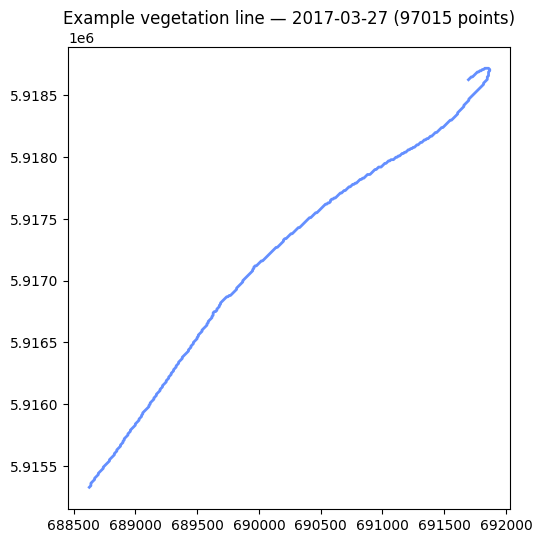

Baseline coastline: 63 points


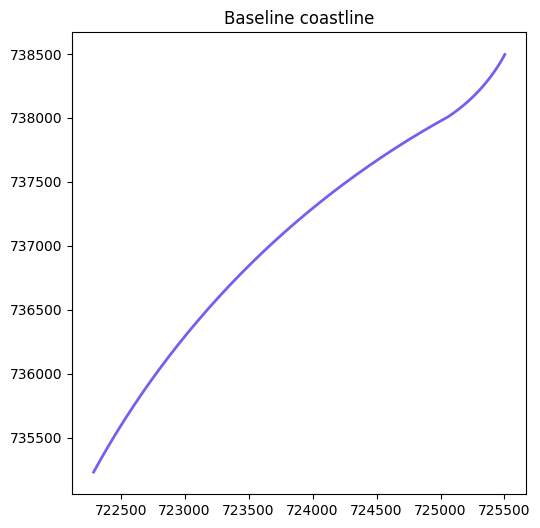

In [23]:
# Seasonal change in VL

# --- Individual vegetation lines (detected VLs that make up the ADVLs) ---
pdvl_path = os.path.join(data_path, "processed/vegetation_lines/detected_vegetation_lines.shp")
individual_veg_lines = gpd.read_file(pdvl_path)

# Date from the first 8 digits of the ID (e.g. 20170327T114349 -> 2017-03-27)
individual_veg_lines['date'] = pd.to_datetime(individual_veg_lines['ID'].str[:8], format='%Y%m%d')

display(individual_veg_lines)

# --- Example line: display geometry + point count ---
example_line = individual_veg_lines.iloc[0]
n_points = len(example_line.geometry.coords)
print(f"Example line ({example_line['date'].date()}): {n_points} points")

fig, ax = plt.subplots(1, 1, figsize=(10, 6))
gpd.GeoSeries([example_line.geometry]).plot(ax=ax, color=blue, linewidth=2)
ax.set_title(f"Example vegetation line — {example_line['date'].date()} ({n_points} points)")
plt.show()

# --- Baseline coastline (DSAS) ---
baseline_path = os.path.join(data_path, "processed/dsas_files/baseline.geojson")
baseline = gpd.read_file(baseline_path)
n_points = sum(len(line.coords) for line in baseline.iloc[0].geometry.geoms)
print(f"Baseline coastline: {n_points} points")

fig, ax = plt.subplots(1, 1, figsize=(10, 6))
baseline.plot(ax=ax, color=purple, linewidth=2)
ax.set_title("Baseline coastline")
plt.show()


In [12]:
from shapely.geometry import Point

# --- Average distance from baseline for each vegetation line ---
# Reproject the baseline into the vegetation lines' CRS before measuring
# distances -- they are stored in different CRSs (ITM vs UTM29N).
baseline_reprojected = baseline.to_crs(individual_veg_lines.crs)
baseline_points = [
    Point(coord)
    for line in baseline_reprojected.geometry.iloc[0].geoms
    for coord in line.coords
]

def avg_distance_from_baseline(veg_line_geom, baseline_points):
    """
    For every point on the baseline, find the minimum distance to the vegetation
    line, then return the average of those minimum distances. Intentionally
    baseline -> vegetation line, not the other way around.
    """
    min_distances = [pt.distance(veg_line_geom) for pt in baseline_points]
    return np.median(min_distances)

individual_veg_lines['avg_dist_from_baseline'] = individual_veg_lines.geometry.apply(
    lambda geom: avg_distance_from_baseline(geom, baseline_points)
)

display(individual_veg_lines)


,ID,year,geometry,date,avg_dist_from_baseline
0,20170327T114349,2017,"LINESTRING (688618.606 5915319.403, 688618.645...",2017-03-27,128.507527
1,20170408T113321,2017,"LINESTRING (688618.417 5915319.556, 688618.456...",2017-04-08,128.785211
2,20170617T113321,2017,"LINESTRING (688619.137 5915318.563, 688619.175...",2017-06-17,127.759732
3,20170620T114351,2017,"LINESTRING (688619.469 5915318.558, 688619.507...",2017-06-20,127.327193
4,20170712T113319,2017,"LINESTRING (688619.502 5915318.362, 688619.54 ...",2017-07-12,127.224612
5,20170717T113321,2017,"LINESTRING (688619.009 5915319.009, 688619.048...",2017-07-17,127.982236
6,20190327T114349,2019,"LINESTRING (688624.86 5915313.77, 688624.898 5...",2019-03-27,126.554739
7,20190329T113321,2019,"LINESTRING (688625.248 5915313.373, 688625.286...",2019-03-29,125.008942
8,20190406T114349,2019,"LINESTRING (688624.646 5915313.39, 688624.684 ...",2019-04-06,122.046733
9,20190411T114351,2019,"LINESTRING (688620.653 5915318.153, 688620.692...",2019-04-11,125.567026


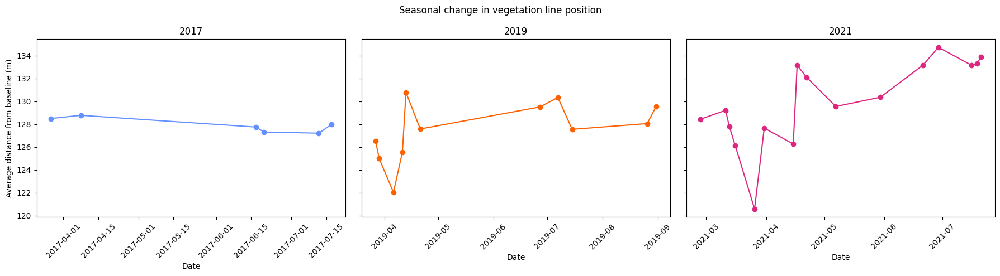

In [13]:
# --- Seasonal change in average distance from baseline ---
year_colours = {'2017': blue, '2019': orange, '2021': red}
years = ['2017', '2019', '2021']

fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

for ax, year in zip(axes, years):
    group = individual_veg_lines[individual_veg_lines['year'] == year].sort_values('date')
    ax.plot(
        group['date'], group['avg_dist_from_baseline'],
        marker='o', color=year_colours[year],
    )
    ax.set_title(year)
    ax.set_xlabel('Date')
    ax.tick_params(axis='x', rotation=45)

axes[0].set_ylabel('Average distance from baseline (m)')
fig.suptitle('Seasonal change in vegetation line position')
plt.tight_layout()
plt.show()


In [26]:
# --- Average distance from that year's average vegetation line ---
from tqdm.auto import tqdm
tqdm.pandas()

avg_lines_path = os.path.join(data_path, "processed/vegetation_lines/average_vegetation_lines.shp")
average_vegetation_lines = gpd.read_file(avg_lines_path)
average_vegetation_lines = average_vegetation_lines.to_crs(individual_veg_lines.crs)

def avg_distance_from_yearly_average(row):
    """
    For every point on that year's average vegetation line, find the minimum
    distance to this individual line, then return the average of those minimum
    distances. Intentionally average line -> individual line, not the other way
    around (same convention as the baseline distance above).
    """
    avg_line_geom = average_vegetation_lines.loc[
        average_vegetation_lines['year'] == row['year'], 'geometry'
    ].iloc[0]
    comparison_points = [Point(coord) for coord in avg_line_geom.coords]
    min_distances = [
        pt.distance(row.geometry)
        for pt in tqdm(comparison_points, desc=str(row['ID']), leave=False)
    ]
    return np.median(min_distances)

individual_veg_lines['avg_dist_from_avg_line'] = individual_veg_lines.progress_apply(
    avg_distance_from_yearly_average, axis=1
)

display(individual_veg_lines)


  0%|          | 0/33 [00:00<?, ?it/s]

20170327T114349:   0%|          | 0/10000 [00:00<?, ?it/s]

20170408T113321:   0%|          | 0/10000 [00:00<?, ?it/s]

20170617T113321:   0%|          | 0/10000 [00:00<?, ?it/s]

20170620T114351:   0%|          | 0/10000 [00:00<?, ?it/s]

20170712T113319:   0%|          | 0/10000 [00:00<?, ?it/s]

20170717T113321:   0%|          | 0/10000 [00:00<?, ?it/s]

20190327T114349:   0%|          | 0/10000 [00:00<?, ?it/s]

20190329T113321:   0%|          | 0/10000 [00:00<?, ?it/s]

20190406T114349:   0%|          | 0/10000 [00:00<?, ?it/s]

20190411T114351:   0%|          | 0/10000 [00:00<?, ?it/s]

20190413T113329:   0%|          | 0/10000 [00:00<?, ?it/s]

20190421T114351:   0%|          | 0/10000 [00:00<?, ?it/s]

20190627T113321:   0%|          | 0/10000 [00:00<?, ?it/s]

20190707T113321:   0%|          | 0/10000 [00:00<?, ?it/s]

20190715T114359:   0%|          | 0/10000 [00:00<?, ?it/s]

20190826T113321:   0%|          | 0/10000 [00:00<?, ?it/s]

20190831T113319:   0%|          | 0/10000 [00:00<?, ?it/s]

20210226T113321:   0%|          | 0/10000 [00:00<?, ?it/s]

20210311T114351:   0%|          | 0/10000 [00:00<?, ?it/s]

20210313T113319:   0%|          | 0/10000 [00:00<?, ?it/s]

20210316T114349:   0%|          | 0/10000 [00:00<?, ?it/s]

20210326T114349:   0%|          | 0/10000 [00:00<?, ?it/s]

20210331T114351:   0%|          | 0/10000 [00:00<?, ?it/s]

20210415T114349:   0%|          | 0/10000 [00:00<?, ?it/s]

20210417T113311:   0%|          | 0/10000 [00:00<?, ?it/s]

20210422T113309:   0%|          | 0/10000 [00:00<?, ?it/s]

20210507T113321:   0%|          | 0/10000 [00:00<?, ?it/s]

20210530T114351:   0%|          | 0/10000 [00:00<?, ?it/s]

20210621T113319:   0%|          | 0/10000 [00:00<?, ?it/s]

20210629T114351:   0%|          | 0/10000 [00:00<?, ?it/s]

20210716T113321:   0%|          | 0/10000 [00:00<?, ?it/s]

20210719T114351:   0%|          | 0/10000 [00:00<?, ?it/s]

20210721T113319:   0%|          | 0/10000 [00:00<?, ?it/s]

,ID,year,geometry,date,avg_dist_from_avg_line
0,20170327T114349,2017,"LINESTRING (688618.606 5915319.403, 688618.645...",2017-03-27,1.584618
1,20170408T113321,2017,"LINESTRING (688618.417 5915319.556, 688618.456...",2017-04-08,1.778873
2,20170617T113321,2017,"LINESTRING (688619.137 5915318.563, 688619.175...",2017-06-17,1.124097
3,20170620T114351,2017,"LINESTRING (688619.469 5915318.558, 688619.507...",2017-06-20,1.423623
4,20170712T113319,2017,"LINESTRING (688619.502 5915318.362, 688619.54 ...",2017-07-12,1.809178
5,20170717T113321,2017,"LINESTRING (688619.009 5915319.009, 688619.048...",2017-07-17,1.178511
6,20190327T114349,2019,"LINESTRING (688624.86 5915313.77, 688624.898 5...",2019-03-27,1.582420
7,20190329T113321,2019,"LINESTRING (688625.248 5915313.373, 688625.286...",2019-03-29,3.123099
8,20190406T114349,2019,"LINESTRING (688624.646 5915313.39, 688624.684 ...",2019-04-06,5.328303
9,20190411T114351,2019,"LINESTRING (688620.653 5915318.153, 688620.692...",2019-04-11,1.609497


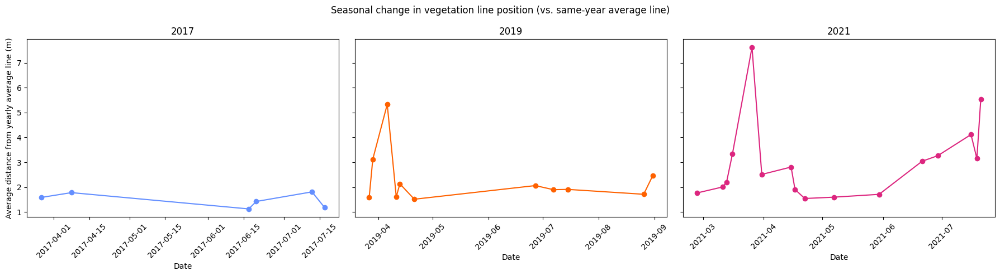

In [27]:
# --- Seasonal change in average distance from that year's average line ---
fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

for ax, year in zip(axes, years):
    group = individual_veg_lines[individual_veg_lines['year'] == year].sort_values('date')
    ax.plot(
        group['date'], group['avg_dist_from_avg_line'],
        marker='o', color=year_colours[year],
    )
    ax.set_title(year)
    ax.set_xlabel('Date')
    ax.tick_params(axis='x', rotation=45)

axes[0].set_ylabel('Average distance from yearly average line (m)')
fig.suptitle('Seasonal change in vegetation line position (vs. same-year average line)')
plt.tight_layout()
plt.show()


In [6]:
# convert tif to pdf

for i in range(1, 21):
    fig_path = os.path.join(figure_path, f"fig{i}.tif")
    img = PIL.Image.open(fig_path)
    pdf_path = os.path.join(figure_path, f"fig{i}.pdf")
    img.save(pdf_path, "PDF", resolution=100.0)

In [8]:
for fig_name in ['pl_fig4.tif','pl_fig1_1.tif','pl_fig1_2.tif','pdvl_fig17.tif','pdvl_fig18.tif','pdvl_fig17_18.tif']:
    fig_path = os.path.join(figure_path, fig_name)
    img = PIL.Image.open(fig_path)
    pdf_path = os.path.join(figure_path, fig_name.replace(".tif",".pdf"))
    img.save(pdf_path, "PDF", resolution=100.0)

In [9]:
fig_name = "individual_lines.tif"
fig_path = os.path.join(figure_path, fig_name)
img = PIL.Image.open(fig_path)
pdf_path = os.path.join(figure_path, fig_name.replace(".tif",".pdf"))
img.save(pdf_path, "PDF", resolution=100.0)

In [5]:
fig_name = "vl_manual_annotation.tif"
fig_path = os.path.join(figure_path, fig_name)
img = PIL.Image.open(fig_path)
pdf_path = os.path.join(figure_path, fig_name.replace(".tif",".pdf"))
img.save(pdf_path, "PDF", resolution=100.0)